# Improving the short-term load forecasting performance of multiple buildings using a data length-sensitivity analysis approach

## Data preparation

In [1]:
import pandas as pd

import seaborn as sns

import numpy as np

from matplotlib import pyplot as plt

import lightgbm as lgb


from sklearn.preprocessing import StandardScaler

from tslearn.clustering import KShape
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
def mae(y_true, y_pred): 
    return mean_absolute_error(y_true, y_pred)
def mape(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
def cv_rmse(y_true, y_pred): 
    return np.sqrt(mean_squared_error(y_pred,y_true))/np.mean(y_true)

def parse_index(index):
#     index = 15816
    building_id = index//(24*731)
    date_id = index%(24*731)//24
    hour_id = index%(24*731)%24
    return building_id,date_id,hour_id

def span2start(train_span):
    if train_span<=10:
        start_month=f'2017-{11-train_span}'
    else:
        start_month=f'2016-{23-train_span}'
    return start_month

def span2start12(train_span):
    if train_span<=11:
        start_month=f'2017-{12-train_span}'
    else:
        start_month=f'2016-{24-train_span}'
    return start_month

import pandas as pd
import numpy as np
from webcolors import hex_to_rgb
%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objects as go

from tslearn.clustering import KernelKMeans

from yellowbrick.cluster import silhouette_visualizer
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

from sklearn.model_selection import train_test_split

from tslearn.clustering import KShape
from tslearn.clustering import TimeSeriesKMeans

/Users/erji/opt/miniconda3/envs/work1/lib/python3.8/site-packages/tslearn/bases/bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)


In [2]:
data = pd.read_csv('./electricity_cleaned.csv',parse_dates=['timestamp'])

In [3]:
weather = pd.read_csv('./weather.csv',parse_dates=['timestamp'])
weather.drop(['cloudCoverage','precipDepth1HR','precipDepth6HR'],axis=1,inplace=True)

In [4]:
building_id = pd.Series(data.columns[1:])
building_id = pd.concat([building_id,building_id.apply(lambda x:x.split('_')[0]),building_id.apply(lambda x:x.split('_')[1]),building_id.apply(lambda x:x.split('_')[2])],axis=1)

In [5]:
building_id.columns=['id','Site','Psu','name']
building_stat = building_id.groupby(['Site','Psu'])['id'].count().unstack(fill_value=0)
site_info_pd = pd.read_csv('./Site_info.csv',index_col='Site').sort_index()
# site_info_pd.loc[site_info_pd.Location=='Anonymous','Location'] = [f"Anonymous {i+1}" for i in range(sum(site_info_pd.Location=='Anonymous'))]

In [6]:
for loc in site_info_pd.Location.value_counts()[(site_info_pd.Location.value_counts()>1)].index:
    site_info_pd.loc[site_info_pd.Location==loc,'Location'] = [f"{loc} {i+1}" for i in range(sum(site_info_pd.Location==loc))]

In [7]:
building_stat.index = site_info_pd.Location
building_stat.sort_index(inplace=True)
building_stat['site_count'] = building_stat.apply(lambda x: x.sum(), axis=1)
building_stat.loc['psu_sum'] = building_stat.apply(lambda x: x.sum())
building_stat

Psu,assembly,education,food,health,industrial,lodging,office,other,parking,public,religion,retail,science,services,unknown,utility,warehouse,site_count
Location,,,,,,,,,,,,,,,,,,
Anonymous 1,4,17,0,0,0,3,5,3,0,1,0,0,1,0,0,0,1,35
Anonymous 2,11,26,2,10,0,10,40,0,0,7,0,0,0,0,0,0,0,106
Anonymous 3,26,0,0,0,0,0,8,9,0,29,0,0,0,0,0,0,2,74
Anonymous 4,11,24,1,3,5,11,73,3,8,5,0,0,1,4,0,0,3,152
Anonymous 5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,19,0,0,19
"Austin, TX",17,63,0,0,0,19,17,0,0,2,0,0,0,5,0,0,0,123
"Berkeley, CA",9,67,0,0,0,4,0,0,3,6,0,0,2,0,0,1,0,92
"Cardiff, UK",29,83,1,1,4,2,17,2,0,6,0,0,0,0,0,0,1,146
"Cornell, NY",16,43,0,0,2,28,18,0,0,6,1,0,1,0,0,2,0,117


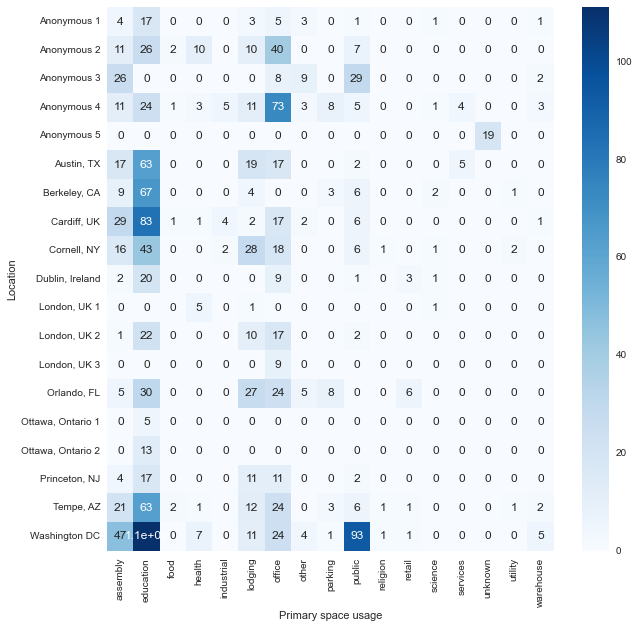

In [8]:
plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
sns.heatmap(building_stat.iloc[:-1,:-1],cmap='Blues',annot=True)
plt.xlabel('Primary space usage')
plt.savefig('./plots/psu_heatmap.svg')

In [9]:
selection = ['','','']

In [10]:
number=2

data1 = data.filter(regex=(f"(?=.*{selection[0]}.*)(?={selection[1]}.*)(?=.*{selection[2]})"))
data1 = data1.set_index('timestamp')
# data1.index = data.timestamp

mask_same_count = [data1.iloc[:,i].value_counts().max()<1000 for i in range(data1.shape[1])]

mask_na_count = data1.isna().sum()<400

data2 = data1.loc[:,mask_na_count&mask_same_count].copy()
data2.fillna(method='ffill',inplace=True)
data2.fillna(method='bfill',inplace=True)
data3 = data2.iloc[:,number].copy()

weather1 = weather[weather.site_id==data3.name.split('_')[0]].set_index('timestamp',drop=True)
weather1=weather1.join(pd.Series(np.zeros(17544),data1.index,name='temp'),how='outer')
weather1.fillna(method='ffill',inplace=True)
weather1.drop(['temp','site_id'],axis=1,inplace=True)

data3.name = 'load'
data4 = pd.concat([data3,weather1],axis=1)

data4['month'] = data4.index.month
data4['weekday'] = data4.index.weekday
data4['hour'] = data4.index.hour

data4['load_lag24'] = data4['load'].shift(24)
# data4['load_lag48'] = data4['load'].shift(48)
# data4['load_lag72'] = data4['load'].shift(72)

data4 = data4.fillna(method='backfill')


In [11]:
same_count = np.array([data1.iloc[:,i].value_counts().max() for i in range(data1.shape[1])])

In [12]:
data

,timestamp,Panther_parking_Lorriane,Panther_lodging_Cora,Panther_office_Hannah,Panther_lodging_Hattie,Panther_education_Teofila,Panther_education_Jerome,Panther_retail_Felix,Panther_parking_Asia,Panther_education_Misty,...,Cockatoo_public_Caleb,Cockatoo_education_Tyler,Cockatoo_public_Shad,Mouse_health_Buddy,Mouse_health_Modesto,Mouse_lodging_Vicente,Mouse_health_Justin,Mouse_health_Ileana,Mouse_health_Estela,Mouse_science_Micheal
0,2016-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,123.200,727.575,69.200,8.8224,370.0870,10.0,282.9965,26.0,135.0,168.2243
1,2016-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,126.475,731.200,66.275,17.6449,737.8260,30.0,574.9265,51.0,265.0,336.4486
2,2016-01-01 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,127.825,724.675,64.675,17.6449,729.9255,30.0,570.2780,50.0,272.0,336.4486
3,2016-01-01 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,130.475,737.375,65.875,17.6449,722.2620,20.0,561.1470,52.0,276.0,336.4486
4,2016-01-01 04:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,129.675,721.150,66.275,17.6449,719.1665,30.0,564.3695,50.0,280.0,336.4486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2017-12-31 19:00:00,15.4830,135.2261,3.4357,79.1353,105.6374,465.0898,67.0199,35.7069,16.3231,...,96.925,704.950,111.350,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17540,2017-12-31 20:00:00,12.7224,135.9262,3.4087,81.6958,107.7348,463.6895,56.6869,35.7069,16.0831,...,97.550,695.700,115.875,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17541,2017-12-31 21:00:00,11.2822,135.1761,3.3546,82.8160,106.1295,461.2890,55.0576,35.5068,16.1631,...,93.825,687.325,111.650,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17542,2017-12-31 22:00:00,16.9233,137.6266,3.2876,82.3359,109.6282,460.5889,49.6776,35.7069,14.8829,...,94.150,674.275,111.950,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
a=[]
b=[]
c=[]
d=[]
null_matrix = []
for i in np.arange(0,2100,50):
    temp = []
    for j in np.arange(0,2100,50):
        temp.append(sum((data1.isna().sum()<i)&(same_count<j)))
    null_matrix.append(temp)

/var/folders/gr/ftq0y20n2xjbrr0002b9mt6w0000gn/T/ipykernel_4414/281379930.py:3: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



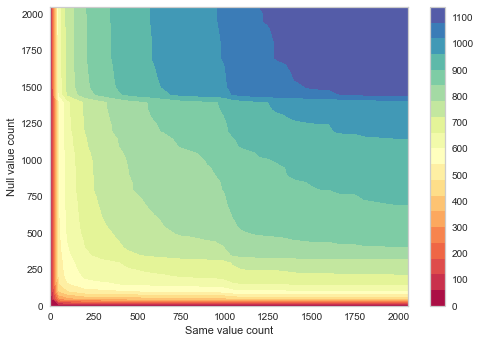

In [14]:
X, Y = np.meshgrid(np.arange(0,2100,50), np.arange(0,2100,50))
a=plt.contourf(X, Y, np.array(null_matrix),20, cmap=plt.cm.Spectral)
plt.colorbar(a, ticks=np.arange(0,1600,100))
# plt.xlim(0,1900)
plt.xticks(np.arange(0,2100,250))
plt.yticks(np.arange(0,2100,250))
plt.ylabel('Null value count')
plt.xlabel('Same value count')
plt.savefig('./plots/null_same_count.svg')

## Calculate CV-RMSE curves for each building

In [ ]:
result= []
for i in range(data2.shape[1]):
    data3 = data2.loc[:,:].iloc[:,i].copy()
    data3.name = 'load'
    data4 = pd.concat([data3,weather1],axis=1)
    data4['month'] = data4.index.month
    data4['weekday'] = data4.index.weekday
    data4['hour'] = data4.index.hour

    data4['load_lag24'] = data4['load'].shift(24)
    data4['load_lag25'] = data4['load'].shift(25)
    data4 = data4.fillna(-999)

    cv_rmse_list_11 = []
    flag = 0
    for train_span in np.arange(1,23):
            start_month = span2start(train_span)


            X_tr = data4[f'{start_month}':'2017-10'].drop(['load'],axis=1)

            # X_tr = data4['2017-10'].drop(['load']+drop_list,axis=1)

            y_tr = np.log(data4[f'{start_month}':'2017-10'].load)
            # y_tr = np.log(data4['2017-10'].load)

            X_te = data4['2017-11'].drop(['load'],axis=1)
            y_te = data4['2017-11'].load

            params = {
                "objective": "regression",
                "num_leaves": 10,
                "learning_rate": 0.08,
                "reg_lambda": 1,
                "metric": "rmse",
                'max_depth':7,
                'min_child_samples': 10,
                'n_estimators':50,
                'verbose':-1
            }
            llf = lgb.LGBMRegressor(**params)
            cat_features = ['month','weekday','hour']
            try:
                llf.fit(X_tr,y_tr,categorical_feature = cat_features,verbose=False)
            except:
                flag = 1
                continue
                
            y_te_pred = np.exp(llf.predict(X_te))
            cv_rmse_list_11.append(cv_rmse(y_te_pred,y_te))

            
    cv_rmse_list_12 = []
    for train_span in np.arange(1,24):
            start_month = span2start12(train_span)


            X_tr = data4[f'{start_month}':'2017-11'].drop(['load'],axis=1)

            # X_tr = data4['2017-10'].drop(['load']+drop_list,axis=1)

            y_tr = np.log(data4[f'{start_month}':'2017-11'].load)
            # y_tr = np.log(data4['2017-10'].load)

            X_te = data4['2017-12'].drop(['load'],axis=1)
            y_te = data4['2017-12'].load

            params = {
                "objective": "regression",
                "num_leaves": 10,
                "learning_rate": 0.08,
                "reg_lambda": 1,
                "metric": "rmse",
                'max_depth':7,
                'min_child_samples': 10,
                'n_estimators':50,
                'verbose':-1
            }
            llf = lgb.LGBMRegressor(**params)
            cat_features = ['month','weekday','hour']
            try:
                llf.fit(X_tr,y_tr,categorical_feature = cat_features,verbose=False)
            except:
                flag = 1
                continue

            y_te_pred = np.exp(llf.predict(X_te))
            cv_rmse_list_12.append(cv_rmse(y_te_pred,y_te))

#     cv_rmse_list_11_mod = []
#     for i,n in enumerate(np.array(cv_rmse_list_11)):
#         cv_rmse_list_11_mod.append(n-np.log2(i+5)*np.mean(cv_rmse_list_11)*0.05)
    if flag == 1:
        result.append([[-1]*22,[-1]*23])
    else:
        result.append([cv_rmse_list_11,cv_rmse_list_12])

/var/folders/gr/ftq0y20n2xjbrr0002b9mt6w0000gn/T/ipykernel_4414/3216317123.py:27: FutureWarning:

Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.

/var/folders/gr/ftq0y20n2xjbrr0002b9mt6w0000gn/T/ipykernel_4414/3216317123.py:28: FutureWarning:

Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.

/Users/erji/opt/miniconda3/envs/work1/lib/python3.8/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.

/var/folders/gr/ftq0y20n2xjbrr0002b9mt6w0000gn/T/ipykernel_4414/3216317123.py:27: FutureWarning:

Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. 

In [16]:
result_w1= []
for i in range(data2.shape[1]):
    data3 = data2.loc[:,:].iloc[:,i].copy()
    data3.name = 'load'
    data4 = pd.concat([data3,weather1],axis=1)
    data4['month'] = data4.index.month
    data4['weekday'] = data4.index.weekday
    data4['hour'] = data4.index.hour

    data4['load_lag24'] = data4['load'].shift(24)
    data4['load_lag25'] = data4['load'].shift(25)
    data4 = data4.fillna(-999)

    flag = 0

    cv_rmse_list_12_w1 = []
    for train_span in np.arange(1,24):
            start_month = span2start12(train_span)


            X_tr = data4[f'{start_month}':'2017-11'].drop(['load'],axis=1)

            # X_tr = data4['2017-10'].drop(['load']+drop_list,axis=1)

            y_tr = np.log(data4[f'{start_month}':'2017-11'].load)
            # y_tr = np.log(data4['2017-10'].load)

            X_te = data4['2017-12-1':'2017-12-7'].drop(['load'],axis=1)
            y_te = data4['2017-12-1':'2017-12-7'].load

            params = {
                "objective": "regression",
                "num_leaves": 10,
                "learning_rate": 0.08,
                "reg_lambda": 1,
                "metric": "rmse",
                'max_depth':7,
                'min_child_samples': 10,
                'n_estimators':50,
                'verbose':-1
            }
            llf = lgb.LGBMRegressor(**params)
            cat_features = ['month','weekday','hour']
            try:
                llf.fit(X_tr,y_tr,categorical_feature = cat_features,verbose=False)
            except:
                flag = 1
                continue

            y_te_pred = np.exp(llf.predict(X_te))
            cv_rmse_list_12_w1.append(cv_rmse(y_te_pred,y_te))

    if flag == 1:
        result_w1.append([-1]*23)
    else:
        result_w1.append(cv_rmse_list_12_w1)

/Users/erji/opt/miniconda3/envs/work1/lib/python3.8/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.

/Users/erji/opt/miniconda3/envs/work1/lib/python3.8/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.

/Users/erji/opt/miniconda3/envs/work1/lib/python3.8/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.

/Users/erji/opt/miniconda3/envs/work1/lib/python3.8/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.

/Users/erji/opt/miniconda3/envs/work1/lib/python3.8/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.

/Users/erji/opt/miniconda3/envs/work1/lib/python3.8/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.

/Users/erji/opt/miniconda3/envs/work1/lib/python3.8/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.


In [17]:
# curve_11: cv(rmse) curves on the training data
curve_11 = np.array([item[0] for item in result]).T

# cv(rmse) curves on the test data in scenario A
curve_12_w1 = np.array(result_w1).T

# cv(rmse) curves on the test data in scenario B
curve_12 = np.array([item[1] for item in result]).T


## find the best cluster number through silhouette

In [18]:
plt.rcdefaults()

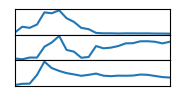

In [19]:
fig,ax = plt.subplots(3,1,sharex=True,figsize=(2,1))
# plt.subplot(311)
ax[0].plot(curve_11[:,0])
ax[0].set_yticks([])
# plt.subplot(312)
ax[1].plot(curve_11[:,1])
ax[1].set_yticks([])
# plt.subplot(313)
ax[2].plot(curve_11[:,-1])
ax[2].set_yticks([])

plt.xlim(0,21)
# plt.xticks(np.arange(0,23,10),np.arange(1,24,10))
plt.xticks([])

plt.subplots_adjust(hspace=.0)
plt.savefig('./plots/a.svg')

In [20]:
def find_n_clusters(algo):
    range_n_clusters = np.arange(2,8)
    result = []
    for n_clusters in range_n_clusters:
        seed = 0
        np.random.seed(seed)
        X_train = TimeSeriesScalerMeanVariance().fit_transform(curve_11.T)
        sz = X_train.shape[1]

        if algo == 'ks':
            model = KShape(n_clusters=n_clusters, verbose=False, random_state=seed)
        if algo == 'km':
            model = TimeSeriesKMeans(n_clusters=n_clusters, verbose=False, random_state=seed)
        if algo == 'dba':
            model =TimeSeriesKMeans(n_clusters=n_clusters,
                              n_init=2,
                              metric="dtw",
                              verbose=False,
                              max_iter_barycenter=10,
                              random_state=seed)
        if algo =='sdtw':
            model = TimeSeriesKMeans(n_clusters=n_clusters,
                                   metric="softdtw",
                                   metric_params={"gamma": .01},
                                   verbose=False,
                                   random_state=seed)
        if algo == 'gak':
            model = KernelKMeans(n_clusters=n_clusters,
                              kernel="gak",
                              kernel_params={"sigma": "auto"},
                              n_init=20,
                              verbose=False,
                              random_state=seed)

        y_pred = model.fit_predict(X_train)

        fig, (ax1) = plt.subplots(1, 1)
        fig.set_size_inches(7, 4)
        silhouette_avg = silhouette_score(X_train.reshape(-1,22), y_pred)
        sample_silhouette_values = silhouette_samples(X_train.reshape(-1,22), y_pred)
        result.append(silhouette_avg)
#         print("For n_clusters =", n_clusters,"The average silhouette_score is :", silhouette_avg)
        y_lower = 10
        for i in range(n_clusters):
                # Aggregate the silhouette scores for samples belonging to
                # cluster i, and sort them
                ith_cluster_silhouette_values = \
                    sample_silhouette_values[y_pred == i]

                ith_cluster_silhouette_values.sort()

                size_cluster_i = ith_cluster_silhouette_values.shape[0]
                y_upper = y_lower + size_cluster_i

                color = cm.nipy_spectral(float(i) / n_clusters)
                ax1.fill_betweenx(np.arange(y_lower, y_upper),
                                  0, ith_cluster_silhouette_values,
                                  facecolor=color, edgecolor=color, alpha=0.7)

                # Label the silhouette plots with their cluster numbers at the middle
                ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

                # Compute the new y_lower for next plot
                y_lower = y_upper + 10  # 10 for the 0 samples
        ax1.set_xlabel("Silhouette coefficient")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.2, 0, 0.2, 0.4, 0.6])
        plt.savefig(f'./cluster_score_{algo}_{n_clusters}.svg')
    return result

/var/folders/gr/ftq0y20n2xjbrr0002b9mt6w0000gn/T/ipykernel_4414/1022681030.py:37: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



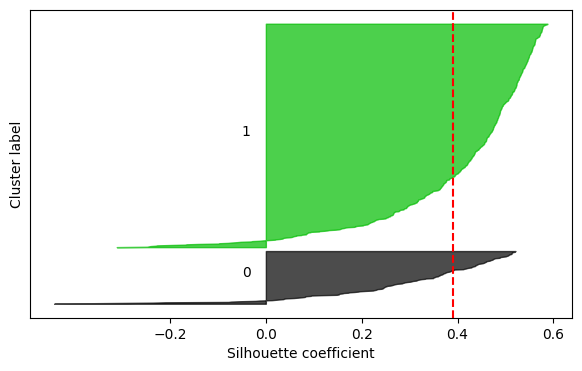

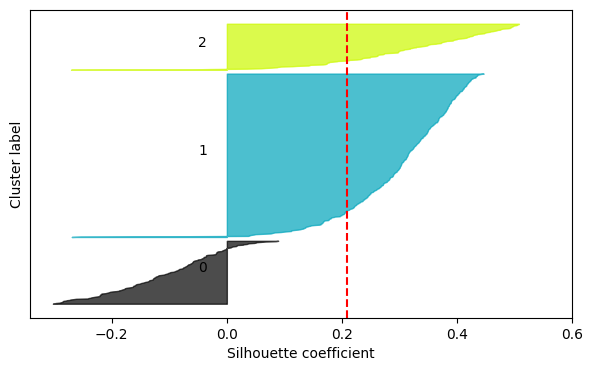

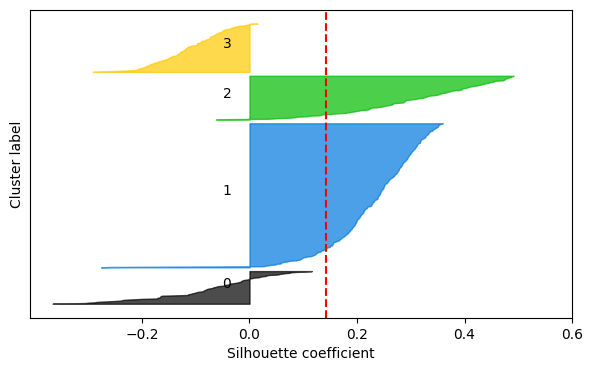

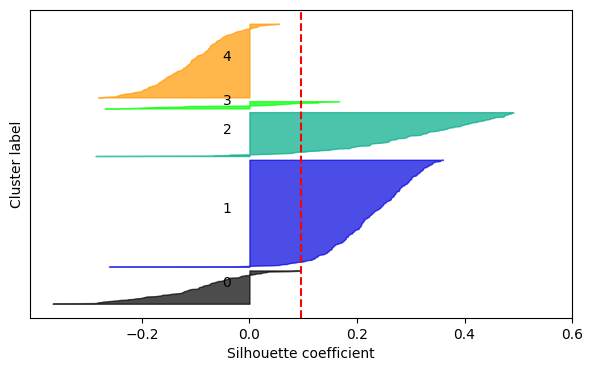

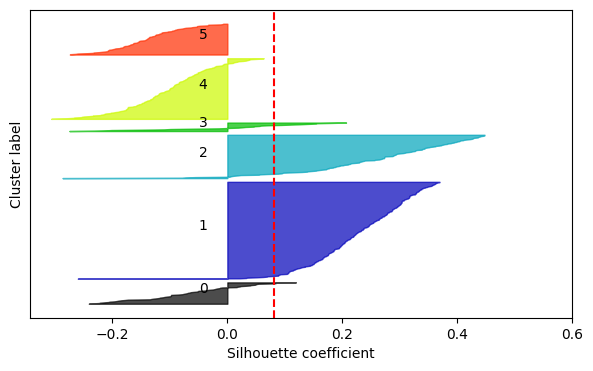

...

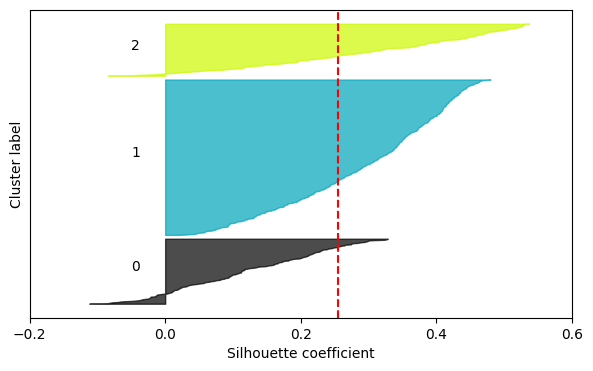

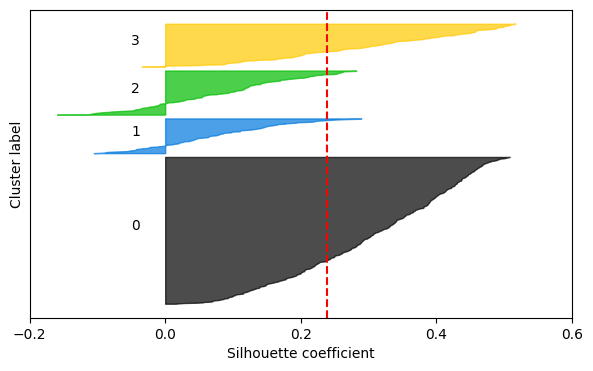

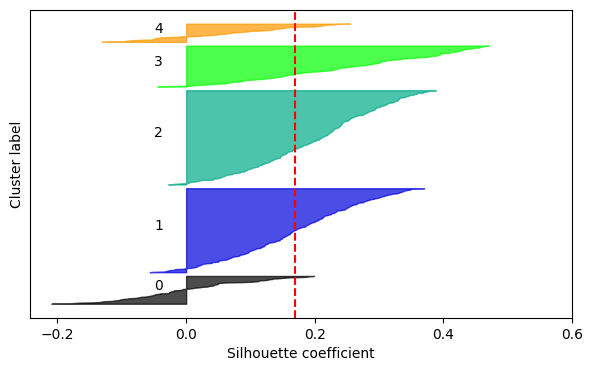

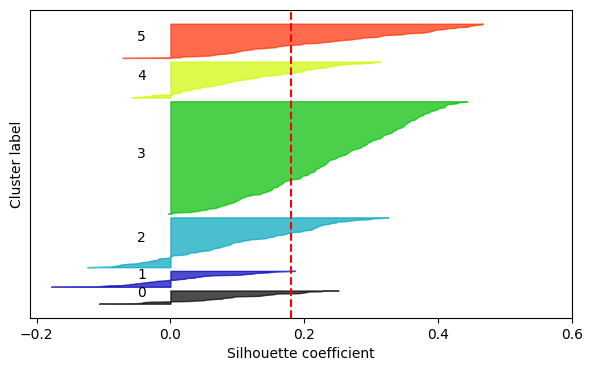

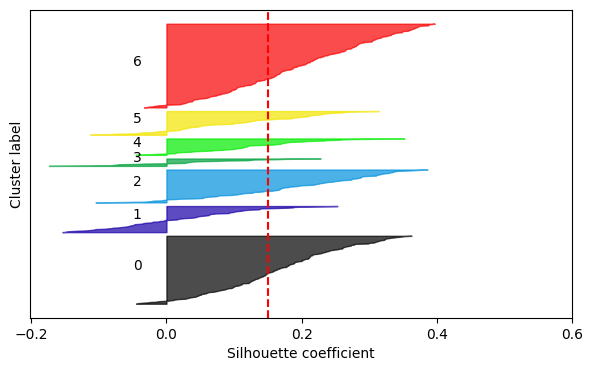

In [21]:
algo_score = []
algo_score.append(find_n_clusters('ks'))
algo_score.append(find_n_clusters('km'))
algo_score.append(find_n_clusters('dba'))
algo_score.append(find_n_clusters('sdtw'))
algo_score.append(find_n_clusters('gak'))

In [22]:
pd.DataFrame(algo_score,index=['ks','km','dba','sdtw','gak'],columns = np.arange(2,8,1)).to_csv('./sihouette.csv')

In [23]:
legend_list = ['KS','KM','DTW','SDTW','GK']

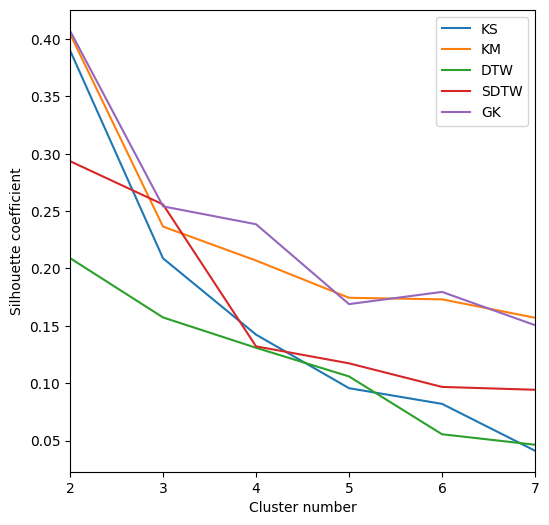

In [24]:
plt.rcdefaults()
pd.read_csv('./sihouette.csv',index_col=0).T.plot(figsize=(6,6))
plt.xlim(0,5)
plt.legend(legend_list)
plt.xlabel('Cluster number')
plt.ylabel('Silhouette coefficient')
plt.savefig('./plots/silhouttte_score.svg')

In [25]:
n_clusters = 2
seed = 0
np.random.seed(seed)

In [26]:
X_train = TimeSeriesScalerMeanVariance().fit_transform(curve_11.T)
sz = X_train.shape[1]
ks = KShape(n_clusters=n_clusters, verbose=False, random_state=seed)
y_pred_ks = ks.fit_predict(X_train)

In [27]:
X_train = TimeSeriesScalerMeanVariance().fit_transform(curve_11.T)
sz = X_train.shape[1]
sdtw_km = TimeSeriesKMeans(n_clusters=n_clusters,
                           metric="softdtw",
                           metric_params={"gamma": .01},
                           verbose=False,
                           random_state=seed)
y_pred_sdtw = sdtw_km.fit_predict(X_train)

In [28]:
X_train = TimeSeriesScalerMeanVariance().fit_transform(curve_11.T)
sz = X_train.shape[1]
dba_km = TimeSeriesKMeans(n_clusters=n_clusters,
                      n_init=2,
                      metric="dtw",
                      verbose=False,
                      max_iter_barycenter=10,
                      random_state=seed)
y_pred_dba = dba_km.fit_predict(X_train)

In [29]:
X_train = TimeSeriesScalerMeanVariance().fit_transform(curve_11.T)
sz = X_train.shape[1]
km = TimeSeriesKMeans(n_clusters=n_clusters, verbose=False, random_state=seed)
y_pred_km = km.fit_predict(X_train)

In [30]:
X_train = TimeSeriesScalerMeanVariance().fit_transform(curve_11.T)
sz = X_train.shape[1]
gak_km = KernelKMeans(n_clusters=n_clusters,
                      kernel="gak",
                      kernel_params={"sigma": "auto"},
                      n_init=20,
                      verbose=False,
                      random_state=seed)
y_pred_gak = gak_km.fit_predict(X_train)

In [31]:
ignore_index = np.array(np.where(np.array([item for item in curve_11.T])[:,0]==-1)[0])
ignore_index

array([], dtype=int64)

In [32]:
replace_list = [0,1] if n_clusters == 2 else [0,1,2]
y_pred_ks = pd.Series(y_pred_ks).replace(dict(zip(pd.value_counts(y_pred_ks).index,replace_list))).values
y_pred_km = pd.Series(y_pred_km).replace(dict(zip(pd.value_counts(y_pred_km).index,replace_list))).values
y_pred_dba = pd.Series(y_pred_dba).replace(dict(zip(pd.value_counts(y_pred_dba).index,replace_list))).values
y_pred_sdtw = pd.Series(y_pred_sdtw).replace(dict(zip(pd.value_counts(y_pred_sdtw).index,replace_list))).values
y_pred_gak = pd.Series(y_pred_gak).replace(dict(zip(pd.value_counts(y_pred_gak).index,replace_list))).values

In [33]:
pd.value_counts(y_pred_ks[list(set(range(778))-set(ignore_index))]),\
pd.value_counts(y_pred_km[list(set(range(778))-set(ignore_index))]),\
pd.value_counts(y_pred_dba[list(set(range(778))-set(ignore_index))]),\
pd.value_counts(y_pred_sdtw[list(set(range(778))-set(ignore_index))]),\
pd.value_counts(y_pred_gak[list(set(range(778))-set(ignore_index))])

(0    629
 1    149
 dtype: int64,
 0    597
 1    181
 dtype: int64,
 0    451
 1    327
 dtype: int64,
 0    526
 1    252
 dtype: int64,
 0    605
 1    173
 dtype: int64)

In [34]:
cluster_size = pd.DataFrame([[629,597,452,526,605],[149,181,327,252,172]],index=['Cluster 1','Cluster 2'],columns=legend_list)

In [35]:
cluster_size

,KS,KM,DTW,SDTW,GK
Cluster 1,629,597,452,526,605
Cluster 2,149,181,327,252,172


In [36]:
cluster_size.loc['Cluster 1']/cluster_size.loc['Cluster 2']

KS      4.221477
KM      3.298343
DTW     1.382263
SDTW    2.087302
GK      3.517442
dtype: float64

In [37]:
plt.rcdefaults()

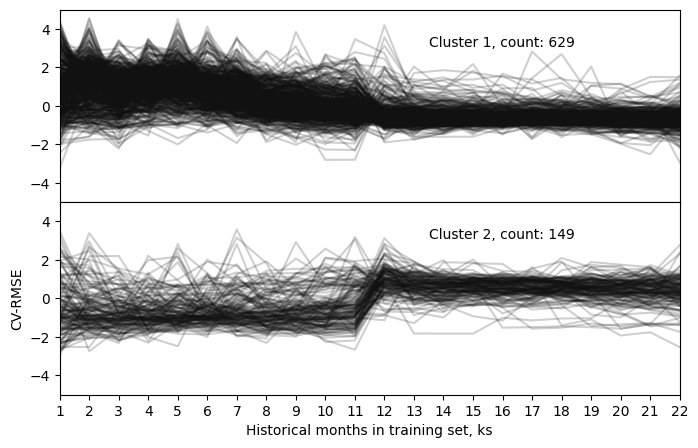

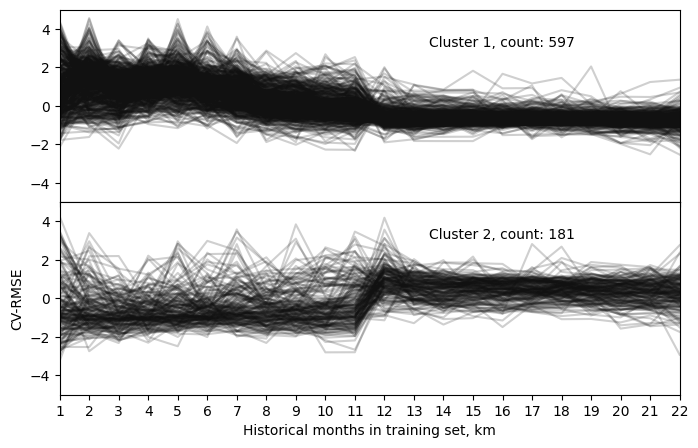

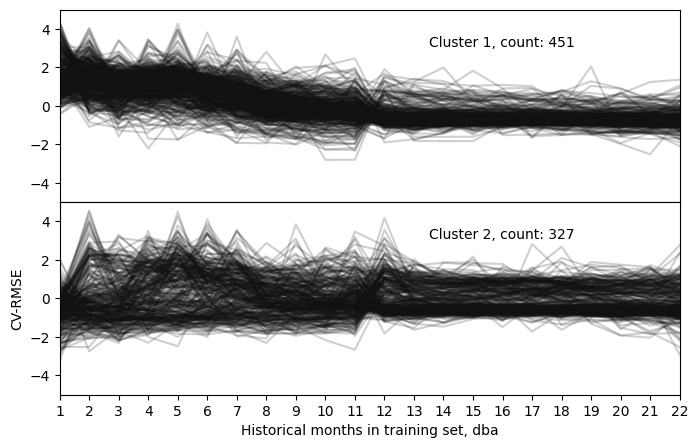

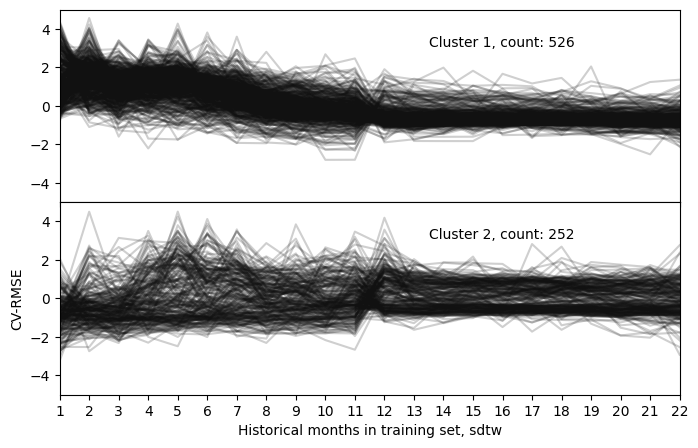

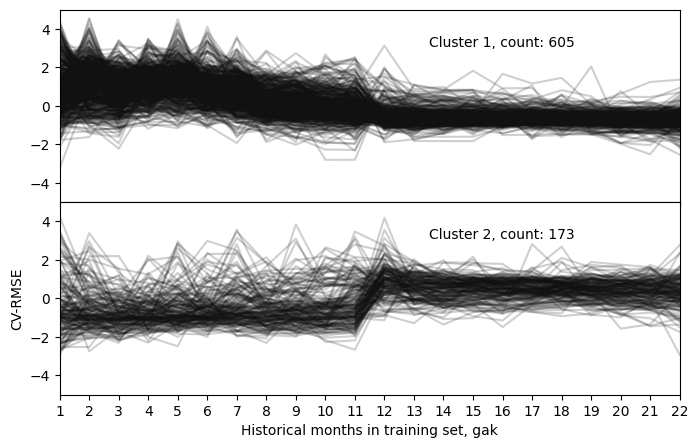

In [38]:
axes = plt.subplots(n_clusters, 1,sharex=True,figsize=(8,5))
for yi in range(n_clusters):
    count = 0
    for xx in X_train[y_pred_ks == yi]:
        if xx[0][0] !=0:
            count += 1
            axes[1][yi].plot(xx.ravel(), "k-", alpha=.2)
    if yi ==1:
        axes[1][yi].set_ylabel('CV-RMSE',position=(0,1))
    plt.xticks(np.arange(0,22),np.arange(1,23))
    axes[1][yi].set_xlim(0, 21)
    axes[1][yi].set_ylim(-5, 5)
    axes[1][yi].text(12.5,3.1,f"Cluster {yi+1}, count: {count}" ,size=10)
plt.subplots_adjust(hspace=.0)
plt.xlabel('Historical months in training set, ks')
plt.savefig('./plots/ks_result.svg')
plt.show()

axes = plt.subplots(n_clusters, 1,sharex=True,figsize=(8,5))
for yi in range(n_clusters):
    count = 0
    for xx in X_train[y_pred_km == yi]:
        if xx[0][0] !=0:
            count += 1
            axes[1][yi].plot(xx.ravel(), "k-", alpha=.2)
    if yi ==1:
        axes[1][yi].set_ylabel('CV-RMSE',position=(0,1))
    plt.xticks(np.arange(0,22),np.arange(1,23))
    axes[1][yi].set_xlim(0, 21)
    axes[1][yi].set_ylim(-5, 5)
    axes[1][yi].text(12.5,3.1,f"Cluster {yi+1}, count: {count}" ,size=10)
plt.subplots_adjust(hspace=.0)
plt.xlabel('Historical months in training set, km')
plt.savefig('./plots/km_result.svg')
plt.show()


axes = plt.subplots(n_clusters, 1,sharex=True,figsize=(8,5))
for yi in range(n_clusters):
    count = 0
    for xx in X_train[y_pred_dba == yi]:
        if xx[0][0] !=0:
            count += 1
            axes[1][yi].plot(xx.ravel(), "k-", alpha=.2)
    if yi ==1:
        axes[1][yi].set_ylabel('CV-RMSE',position=(0,1))
    plt.xticks(np.arange(0,22),np.arange(1,23))
    axes[1][yi].set_xlim(0, 21)
    axes[1][yi].set_ylim(-5, 5)
    axes[1][yi].text(12.5,3.1,f"Cluster {yi+1}, count: {count}" ,size=10)
plt.subplots_adjust(hspace=.0)
plt.xlabel('Historical months in training set, dba')
plt.savefig('./plots/dba_result.svg')
plt.show()


axes = plt.subplots(n_clusters, 1,sharex=True,figsize=(8,5))
for yi in range(n_clusters):
    count = 0
    for xx in X_train[y_pred_sdtw == yi]:
        if xx[0][0] !=0:
            count += 1
            axes[1][yi].plot(xx.ravel(), "k-", alpha=.2)
    if yi ==1:
        axes[1][yi].set_ylabel('CV-RMSE',position=(0,1))
    plt.xticks(np.arange(0,22),np.arange(1,23))
    axes[1][yi].set_xlim(0, 21)
    axes[1][yi].set_ylim(-5, 5)
    axes[1][yi].text(12.5,3.1,f"Cluster {yi+1}, count: {count}" ,size=10)
plt.subplots_adjust(hspace=.0)
plt.xlabel('Historical months in training set, sdtw')
plt.savefig('./plots/sdtw_result.svg')
plt.show()


axes = plt.subplots(n_clusters, 1,sharex=True,figsize=(8,5))
for yi in range(n_clusters):
    count = 0
    for xx in X_train[y_pred_gak == yi]:
        if xx[0][0] !=0:
            count += 1
            axes[1][yi].plot(xx.ravel(), "k-", alpha=.2)
    if yi ==1:
        axes[1][yi].set_ylabel('CV-RMSE',position=(0,1))
    plt.xticks(np.arange(0,22),np.arange(1,23))
    axes[1][yi].set_xlim(0, 21)
    axes[1][yi].set_ylim(-5, 5)
    axes[1][yi].text(12.5,3.1,f"Cluster {yi+1}, count: {count}" ,size=10)
plt.subplots_adjust(hspace=.0)
plt.xlabel('Historical months in training set, gak')
plt.savefig('./plots/gak_result.svg')
plt.show()

In [39]:
data

,timestamp,Panther_parking_Lorriane,Panther_lodging_Cora,Panther_office_Hannah,Panther_lodging_Hattie,Panther_education_Teofila,Panther_education_Jerome,Panther_retail_Felix,Panther_parking_Asia,Panther_education_Misty,...,Cockatoo_public_Caleb,Cockatoo_education_Tyler,Cockatoo_public_Shad,Mouse_health_Buddy,Mouse_health_Modesto,Mouse_lodging_Vicente,Mouse_health_Justin,Mouse_health_Ileana,Mouse_health_Estela,Mouse_science_Micheal
0,2016-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,123.200,727.575,69.200,8.8224,370.0870,10.0,282.9965,26.0,135.0,168.2243
1,2016-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,126.475,731.200,66.275,17.6449,737.8260,30.0,574.9265,51.0,265.0,336.4486
2,2016-01-01 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,127.825,724.675,64.675,17.6449,729.9255,30.0,570.2780,50.0,272.0,336.4486
3,2016-01-01 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,130.475,737.375,65.875,17.6449,722.2620,20.0,561.1470,52.0,276.0,336.4486
4,2016-01-01 04:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,129.675,721.150,66.275,17.6449,719.1665,30.0,564.3695,50.0,280.0,336.4486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2017-12-31 19:00:00,15.4830,135.2261,3.4357,79.1353,105.6374,465.0898,67.0199,35.7069,16.3231,...,96.925,704.950,111.350,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17540,2017-12-31 20:00:00,12.7224,135.9262,3.4087,81.6958,107.7348,463.6895,56.6869,35.7069,16.0831,...,97.550,695.700,115.875,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17541,2017-12-31 21:00:00,11.2822,135.1761,3.3546,82.8160,106.1295,461.2890,55.0576,35.5068,16.1631,...,93.825,687.325,111.650,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17542,2017-12-31 22:00:00,16.9233,137.6266,3.2876,82.3359,109.6282,460.5889,49.6776,35.7069,14.8829,...,94.150,674.275,111.950,NaN,NaN,NaN,NaN,NaN,NaN,NaN


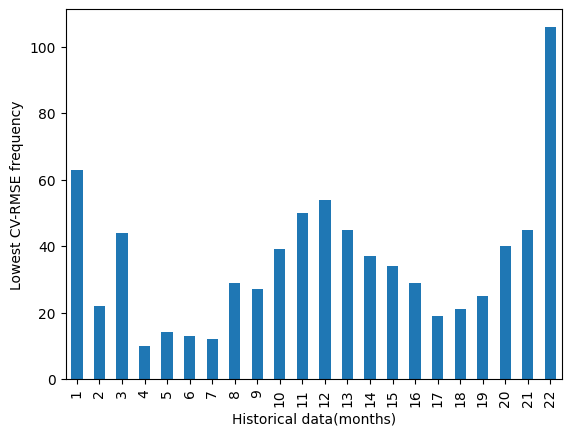

In [40]:
pd.Series(np.argmin(curve_11,axis=0)).value_counts().sort_index().plot.bar()
plt.xticks(np.arange(22),np.arange(1,23))
plt.xlabel('Historical data(months)')
plt.ylabel('Lowest CV-RMSE frequency')
plt.show()

In [41]:
def plot_bar(curve,y_pred,title=''):
    if n_clusters ==3:
        plt.figure(figsize=(20,7))
    else:
        plt.figure(figsize=(15,7))
    ax1 = plt.subplot(1,n_clusters,1)
    ax1.grid()
    a=pd.Series(np.argmin(curve[:,y_pred==0],axis=0)).value_counts()
    for i in range(22):
        if i not in a.index:
            a.loc[i] = 0
    a.sort_index(ascending=True).plot.bar()
    plt.xlabel('Historical data(months)')
    plt.ylabel('Lowest CV-RMSE frequency')
    plt.xticks(np.arange(22),np.arange(1,23))



    ax2 = plt.subplot(1,n_clusters,2)
    plt.title(title)
    a=pd.Series(np.argmin(curve[:,y_pred==1],axis=0)).value_counts()
    for i in range(22):
        if i not in a.index:
            a.loc[i] = 0
    a.sort_index(ascending=True).plot.bar()
    plt.xlabel('Historical data(months)')
    # plt.ylabel('Lowest CV-RMSE frequency')
    plt.xticks(np.arange(22),np.arange(1,23))
    
    if n_clusters ==3:
        plt.subplot(1,3,3)
        a=pd.Series(np.argmin(curve[:,y_pred==2],axis=0)).value_counts()
        for i in range(22):
            if i not in a.index:
                a.loc[i] = 0
        a.sort_index(ascending=True).plot.bar()
        plt.xlabel('Historical data(months)')
        # plt.ylabel('Lowest CV-RMSE frequency')
        plt.xticks(np.arange(22),np.arange(1,23))

    plt.tight_layout()
    
    plt.show()

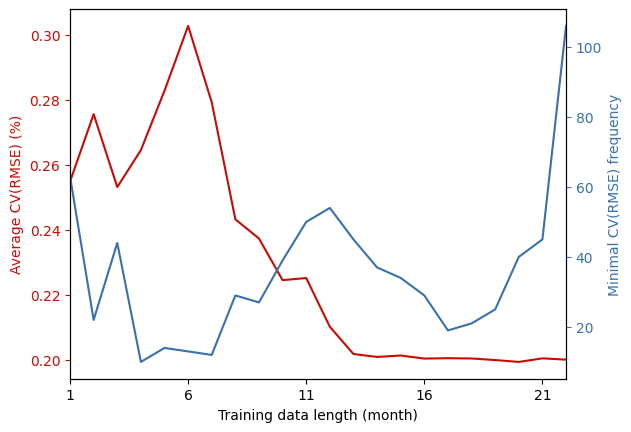

In [42]:
fig,host = plt.subplots()

par1 = host.twinx()


# par1.plot(pd.Series(np.argmin(curve_11,axis=0)).value_counts().sort_index(),'r-')

host.plot(np.arange(1,23,1),curve_11.mean(axis=1),'r-')
host.set_xlabel('Training data length (month)')
host.set_ylabel('Average CV(RMSE) (%)',color='r')
host.tick_params(axis='y',colors='r')

par1.plot(np.arange(1,23,1),pd.Series(np.argmin(curve_11,axis=0)).value_counts().sort_index(),color='#3971ac')
par1.set_ylabel('Minimal CV(RMSE) frequency',color='#3971ac')
par1.tick_params(axis='y',colors='#3971ac')


plt.xlim(1,22)
plt.xticks(np.arange(1,23,5))

plt.savefig('./plots/reference_data result.svg')

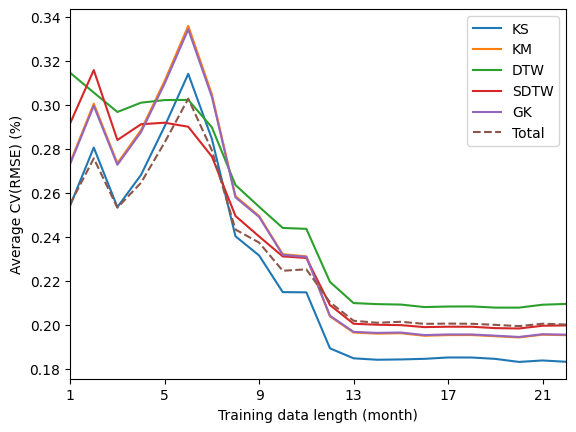

In [43]:
curve = curve_11
for y_pred,method in zip([y_pred_ks,y_pred_km,y_pred_dba,y_pred_sdtw,y_pred_gak],legend_list):
    plt.plot(np.mean(curve[:,y_pred==0],axis=1),label=method)
    
plt.plot(curve_11.mean(axis=1),'--',label='Total')
plt.xlim(0,21)
plt.xticks(np.arange(0,21,4),np.arange(1,22,4))
plt.legend()
plt.xlabel('Training data length (month)')
plt.ylabel('Average CV(RMSE) (%)')
plt.savefig('./plots/meancv_cluster0.svg')

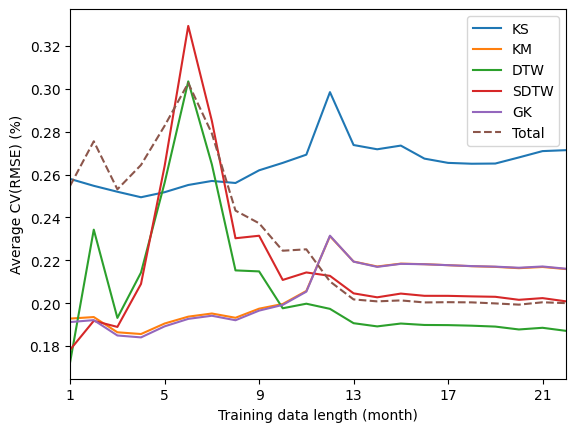

In [44]:
curve = curve_11
for y_pred,method in zip([y_pred_ks,y_pred_km,y_pred_dba,y_pred_sdtw,y_pred_gak],legend_list):
    plt.plot(np.mean(curve[:,y_pred==1],axis=1),label=method)
plt.plot(curve_11.mean(axis=1),'--',label='Total')

plt.xlim(0,21)
plt.xticks(np.arange(0,21,4),np.arange(1,22,4))
plt.legend()
plt.xlabel('Training data length (month)')
plt.ylabel('Average CV(RMSE) (%)')
plt.savefig('./plots/meancv_cluster1.svg')

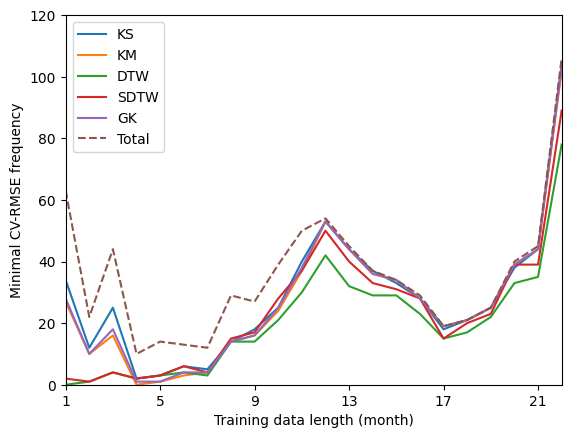

In [45]:
curve = curve_11
for y_pred,method in zip([y_pred_ks,y_pred_km,y_pred_dba,y_pred_sdtw,y_pred_gak],legend_list):
    a=pd.Series(np.argmin(curve[:,y_pred==0],axis=0)).value_counts()
    for i in range(22):
        if i not in a.index:
            a.loc[i] = 0
    a.sort_index(ascending=True).plot(label=method)
plt.plot(pd.Series(np.argmin(curve_11,axis=0)).value_counts().sort_index(),'--',label='Total')
plt.legend()
plt.xlabel('Training data length (month)')
plt.ylabel('Minimal CV-RMSE frequency')
plt.xlim(0,21)
plt.ylim(0,120)
plt.xticks(np.arange(0,21,4),np.arange(1,22,4))
plt.savefig('./plots/freq_cluster0.svg')

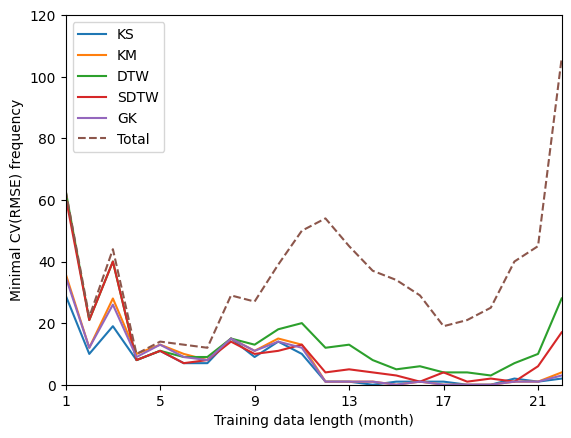

In [46]:
for y_pred,method in zip([y_pred_ks,y_pred_km,y_pred_dba,y_pred_sdtw,y_pred_gak],legend_list):
    a=pd.Series(np.argmin(curve[:,y_pred==1],axis=0)).value_counts()
    for i in range(22):
        if i not in a.index:
            a.loc[i] = 0
    a.sort_index(ascending=True).plot(label=method)
plt.plot(pd.Series(np.argmin(curve_11,axis=0)).value_counts().sort_index(),'--',label='Total')
plt.legend()
plt.xlim(0,21)
plt.ylim(0,120)
plt.xticks(np.arange(0,21,4),np.arange(1,22,4))
plt.xlabel('Training data length (month)')
plt.ylabel('Minimal CV(RMSE) frequency')
plt.savefig('./plots/freq_cluster1.svg')

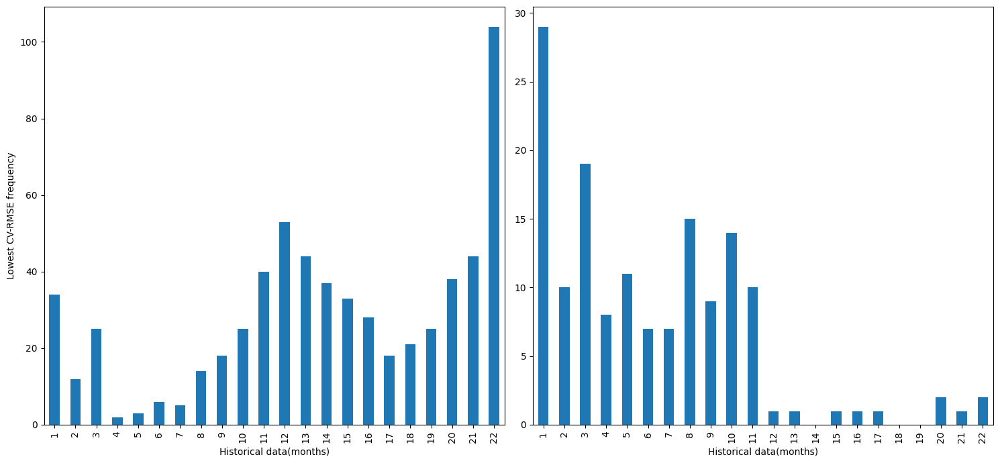

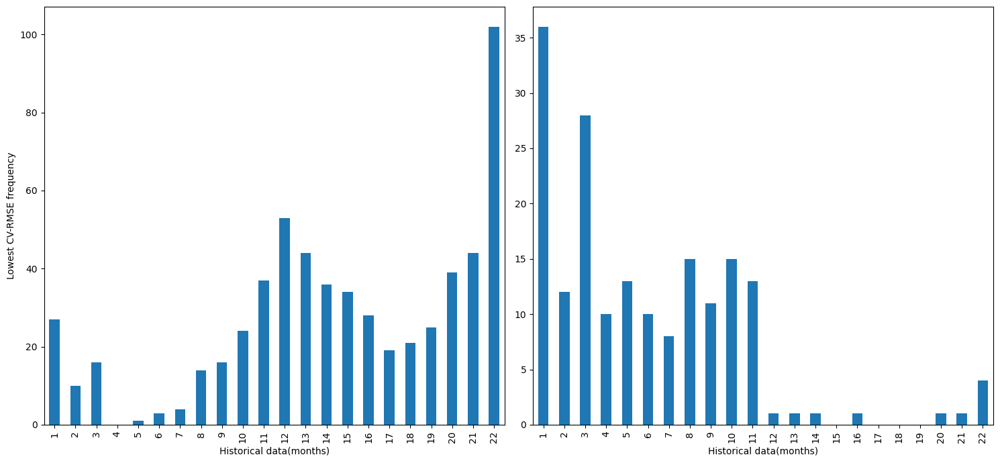

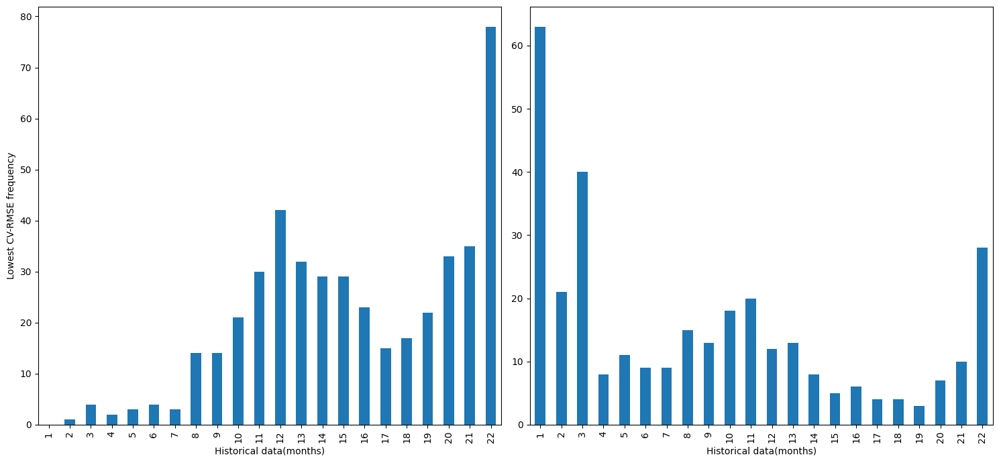

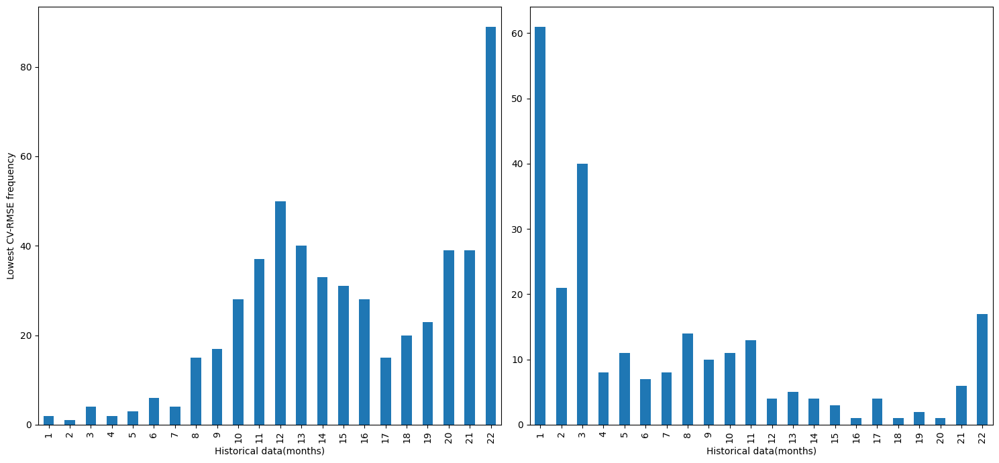

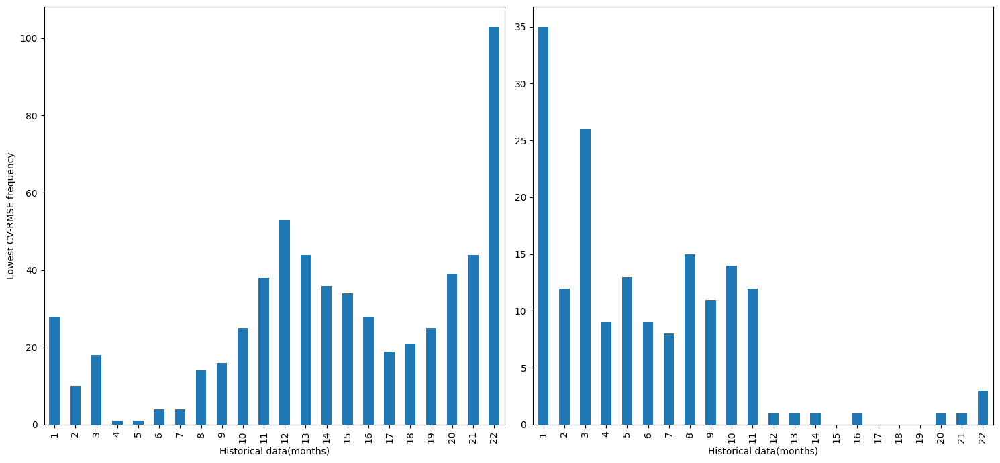

In [47]:
plot_bar(curve_11,y_pred_ks)
plot_bar(curve_11,y_pred_km)
plot_bar(curve_11,y_pred_dba)
plot_bar(curve_11,y_pred_sdtw)
plot_bar(curve_11,y_pred_gak)

## Results

In [49]:
def index_perf(curve_12,index_list,pred_time_list):
    mean_decrease = 0
    count = 0
    for index,time in zip(index_list,pred_time_list):
        if index not in ignore_index:
            mean_decrease += (curve_12[time,index]-curve_12[-1,index])*100/curve_12[-1,index]
            count += 1
    return mean_decrease/count

def index_perf_detail(curve_12,index_list,pred_time_list):
    mean_decrease = 0
    count = 0
    de_detail = []
    for index,time in zip(index_list,pred_time_list):
        if index not in ignore_index:
            mean_decrease += (curve_12[time,index]-curve_12[-1,index])*100/curve_12[-1,index]
            count += 1
            de_detail.append((curve_12[time,index]-curve_12[-1,index])*100/curve_12[-1,index])
    return de_detail

def non_local_opt_index(array1):
    ma = moving_average(array1)
    return np.argmin(ma)


def five_fold(curve_12,y_pred):
    decrease_list = []
    ind_list = []
    for index_tr_ind,index_te_ind in kf.split(np.where(y_pred==cluster)[0]):
        index_tr = np.where(y_pred==cluster)[0][index_tr_ind]
        index_te = np.where(y_pred==cluster)[0][index_te_ind]
        
        
        param_scope = np.arange(0.01,0.2,0.01)
        best_param = None
        best_decrease = 0
        for param in param_scope:
            decrease = index_perf(curve_12,index_tr,[min(22,pred_opt(curve_11[:,index_tr][:,i],param)+1) for i in range(len(index_tr))])
            if decrease < best_decrease:
                best_decrease = decrease
                best_param = param
        decrease_list += index_perf_detail(curve_12,index_te,[min(22,pred_opt(curve_11[:,index_te][:,i],best_param)+1) for i in range(len(index_te))])
    return decrease_list


def pred_opt(array,parameter=0.10):
    try:
        return non_local_opt_index([item - np.log2(j+0.01)*np.mean(array)*parameter for j,item in enumerate(array)])
    except:
        print(array)
        return 21

def f1(array,parameter=0.10):
    return [item - np.log2(j+0.01)*np.mean(array)*parameter for j,item in enumerate(array)]

def moving_average(data_set, periods=2):
    weights = np.ones(periods) / periods
    return np.convolve(data_set, weights, mode='valid')



In [56]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=5,shuffle=True)

In [51]:
# scenari A result
cluster = 1
test_curve = curve_12_w1
de_detail_df = pd.DataFrame([five_fold(test_curve,y_pred_ks),five_fold(test_curve,y_pred_km),five_fold(test_curve,y_pred_dba),five_fold(test_curve,y_pred_sdtw),five_fold(test_curve,y_pred_gak)],index=legend_list)
de_detail_df*=-1
de_detail_df.mean(axis=1)

KS      15.450272
KM      14.852727
DTW      9.239546
SDTW    12.091094
GK      15.246342
dtype: float64

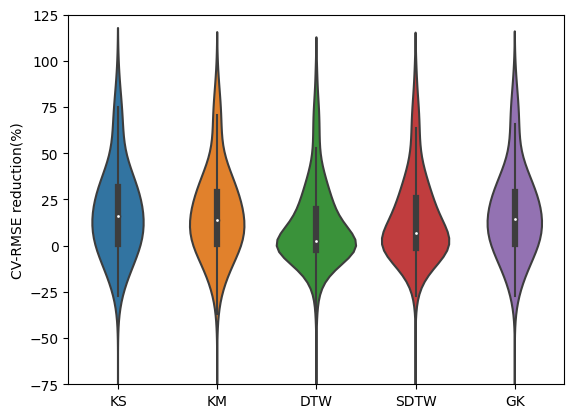

In [52]:
sns.violinplot(data = de_detail_df.replace(-198.975552,0).T)
plt.ylabel('CV-RMSE reduction(%)')
plt.ylim(-75,125)
plt.savefig('./plots/cv_reduction_comparison1.svg')

In [54]:
# scenari B result the result will be slightly different if run again
cluster = 1
test_curve = curve_12
de_detail_df = pd.DataFrame([five_fold(test_curve,y_pred_ks),five_fold(test_curve,y_pred_km),five_fold(test_curve,y_pred_dba),five_fold(test_curve,y_pred_sdtw),five_fold(test_curve,y_pred_gak)],index=legend_list)
de_detail_df*=-1
de_detail_df.mean(axis=1)

KS      2.493138
KM      2.502663
DTW     2.855436
SDTW    2.861705
GK      3.203992
dtype: float64